# Lab 02: Decision Tree
Group Members:
| **Student Name** | **Student ID** |
|:------------:|:----------:|
| Nguyễn Tấn Duy Anh | 22120015 |
| Bùi Hồng Phúc | 22120270 |
| Nguyễn Lê Anh Phúc | 22120276 |
| Hồ Minh Quang | 22120295 |

## Project Preparation
### Import libraries

In [1]:
%pip install scikit-learn ipython graphviz ucimlrepo
from IPython.display import clear_output, display
clear_output()

In [2]:
# Import libraries
import time
import numpy as np  # Random samples generator
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import graphviz

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

### Import datasets

In [3]:
# Import dataset
from ucimlrepo import fetch_ucirepo

# Dataset 1
# Fetch dataset
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id = 17)

# Dataset 2
# Fetch dataset
wine_quality = fetch_ucirepo(id = 186)

# Dataset 3
# Fetch dataset
bank_marketing = fetch_ucirepo(id = 222)

## Dataset 3 (Binary class)
### Preparation

In [4]:
# Dataset 1: breast_cancer_wisconsin_diagnostic
# Dataset 2: wine_quality
features = bank_marketing.data.features
targets = bank_marketing.data.targets

# Optional checking, delete if unnecessary
raw_data = features.copy()
raw_data[targets.keys()] = targets

In [5]:
raw_data

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,NaN,5,may,261,1,-1,0,NaN,no
1,44,technician,single,secondary,no,29,yes,no,NaN,5,may,151,1,-1,0,NaN,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,NaN,5,may,76,1,-1,0,NaN,no
3,47,blue-collar,married,NaN,no,1506,yes,no,NaN,5,may,92,1,-1,0,NaN,no
4,33,NaN,single,NaN,no,1,no,no,NaN,5,may,198,1,-1,0,NaN,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,NaN,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,NaN,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,NaN,no


In [6]:
# Columns description
bank_marketing.variables

,name,role,type,demographic,description,units,missing_values
0,age,Feature,Integer,Age,None,None,no
1,job,Feature,Categorical,Occupation,"type of job (categorical: 'admin.','blue-colla...",None,no
2,marital,Feature,Categorical,Marital Status,"marital status (categorical: 'divorced','marri...",None,no
3,education,Feature,Categorical,Education Level,"(categorical: 'basic.4y','basic.6y','basic.9y'...",None,no
4,default,Feature,Binary,None,has credit in default?,None,no
5,balance,Feature,Integer,None,average yearly balance,euros,no
6,housing,Feature,Binary,None,has housing loan?,None,no
7,loan,Feature,Binary,None,has personal loan?,None,no
8,contact,Feature,Categorical,None,contact communication type (categorical: 'cell...,None,yes
9,day_of_week,Feature,Date,None,last contact day of the week,None,no


In [7]:
# Check for missing values
for col in raw_data.keys():
    print(col + f'\t{raw_data[col].isna().sum()}')
    print(raw_data[col].value_counts())

age	0
age
32    2085
31    1996
33    1972
34    1930
35    1894
      ... 
93       2
90       2
95       2
88       2
94       1
Name: count, Length: 77, dtype: int64
job	288
job
blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
Name: count, dtype: int64
marital	0
marital
married     27214
single      12790
divorced     5207
Name: count, dtype: int64
education	1857
education
secondary    23202
tertiary     13301
primary       6851
Name: count, dtype: int64
default	0
default
no     44396
yes      815
Name: count, dtype: int64
balance	0
balance
 0        3514
 1         195
 2         156
 4         139
 3         134
          ... 
-381         1
 4617        1
 20584       1
 4358        1
 16353       1
Name: count, Length: 7168, dtype: int64
housing	0
housing
yes    25130
no     20081
Name: co

In [8]:
# poutcome has > 75% missing values
# Drop poutcome
raw_data = raw_data.drop('poutcome', axis = 1)
features = features.drop('poutcome', axis = 1)

# Fill NA values based on dataset description
for col in raw_data.select_dtypes(include = 'object').keys():
    if raw_data[col].isna().sum() > 0:
        raw_data[col] = raw_data[col].fillna('unknown')

In [9]:
# Preprocessing
encoders = {}

for col in raw_data.select_dtypes(include = 'object').keys():
    if col != 'y':
        encoder = LabelEncoder()
        raw_data[col] = encoder.fit_transform(raw_data[col])
        encoders[col] = encoder

In [10]:
raw_data

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,y
0,58,4,1,2,0,2143,1,0,2,5,8,261,1,-1,0,no
1,44,9,2,1,0,29,1,0,2,5,8,151,1,-1,0,no
2,33,2,1,1,0,2,1,1,2,5,8,76,1,-1,0,no
3,47,1,1,3,0,1506,1,0,2,5,8,92,1,-1,0,no
4,33,11,2,3,0,1,0,0,2,5,8,198,1,-1,0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,0,825,0,0,0,17,9,977,3,-1,0,yes
45207,71,5,0,0,0,1729,0,0,0,17,9,456,2,-1,0,yes
45208,72,5,1,1,0,5715,0,0,0,17,9,1127,5,184,3,yes
45209,57,1,1,1,0,668,0,0,1,17,9,508,4,-1,0,no


In [11]:
# Extract encoded features and targets
enc_features = raw_data[features.keys()]
enc_targets = raw_data[targets.keys()]

# Create subsets
proportions = [0.4, 0.6, 0.8, 0.9]
batches = []
for train_prop in proportions:
    feature_train, feature_test, label_train, label_test = train_test_split(enc_features, enc_targets, train_size = train_prop, test_size = 1 - train_prop,
                                                                            stratify = enc_targets, random_state = np.uint64(np.random.rand() * 1024))
    batches.append((feature_train, label_train, feature_test, label_test))

### Data Visualization

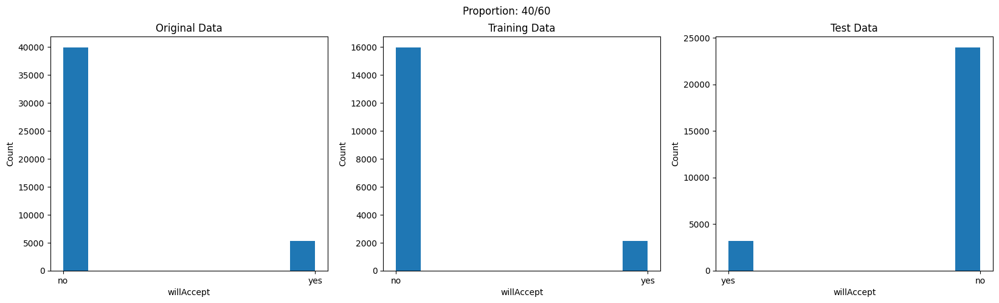

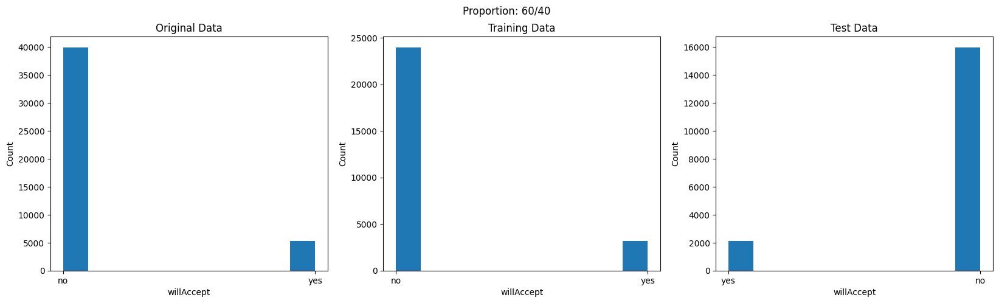

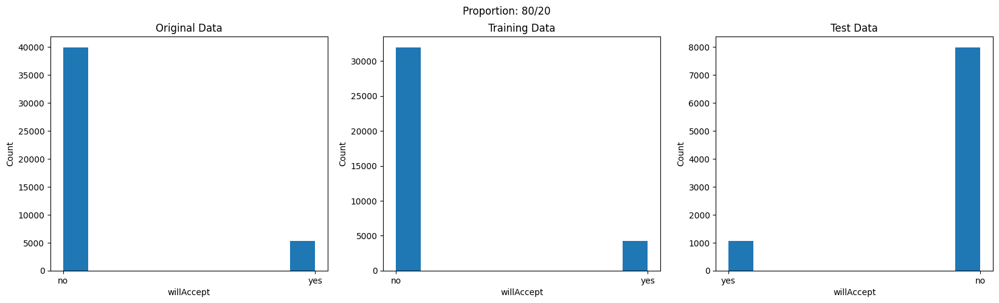

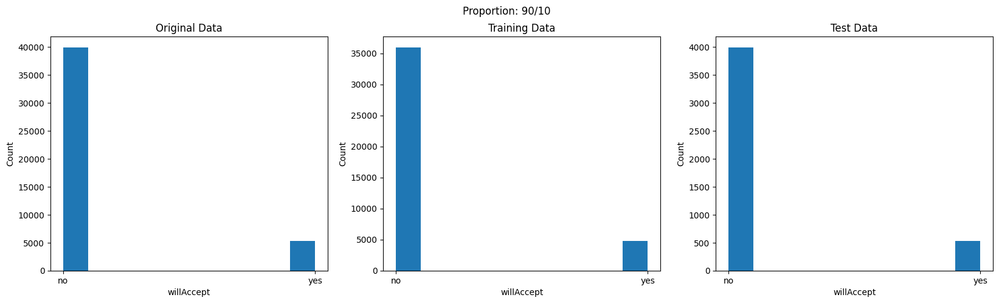

In [12]:
# Change x-axis name to target
for i, (feature_train, label_train, feature_test, label_test) in enumerate(batches):
    plt.figure(figsize=(20, 5))
    plt.suptitle(f'Proportion: {int(proportions[i] * 100)}/{100 - int(proportions[i] * 100)}')
    plt.subplot(1, 3, 1)
    plt.hist(targets)
    plt.title('Original Data')
    plt.xlabel('willAccept')
    plt.ylabel('Count')
    plt.subplot(1, 3, 2)
    plt.hist(label_train)
    plt.title(f'Training Data')
    plt.xlabel('willAccept')
    plt.ylabel('Count')
    plt.subplot(1, 3, 3)
    plt.hist(label_test)
    plt.title(f'Test Data')
    plt.xlabel('willAccept')
    plt.ylabel('Count')
    plt.show()

### Decision Tree Construction
#### 40/60 Proportion

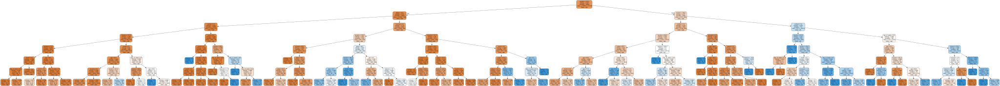

In [13]:
clf_1 = DecisionTreeClassifier(criterion = 'entropy', max_depth = 7)
clf_1 = clf_1.fit(batches[0][0], batches[0][1])

dot_data = export_graphviz(clf_1, feature_names = features.columns, class_names = features.columns,
                           filled = True, rounded = True, special_characters = True)
graph = graphviz.Source(dot_data)
display(graph)

#### 60/40 Proportion

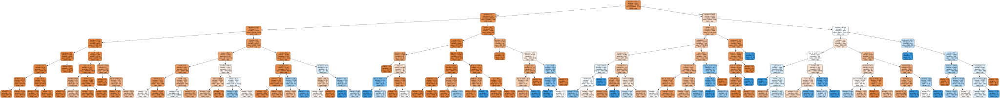

In [14]:
clf_2 = DecisionTreeClassifier(criterion = 'entropy', max_depth = 7)
clf_2 = clf_2.fit(batches[1][0], batches[1][1])

dot_data = export_graphviz(clf_2, feature_names = features.columns, class_names = features.columns,
                           filled = True, rounded = True, special_characters = True)
graph = graphviz.Source(dot_data)
display(graph)

#### 80/20 Proportion

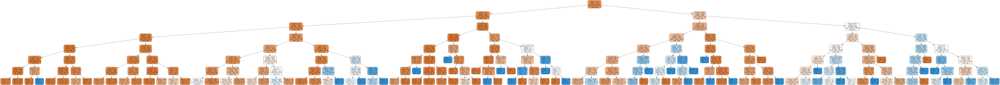

In [15]:
clf_3 = DecisionTreeClassifier(criterion = 'entropy', max_depth = 7)
clf_3 = clf_3.fit(batches[2][0], batches[2][1])

dot_data = export_graphviz(clf_3, feature_names = features.columns, class_names = features.columns,
                           filled = True, rounded = True, special_characters = True)
graph = graphviz.Source(dot_data)
display(graph)

#### 90/10 Proportion

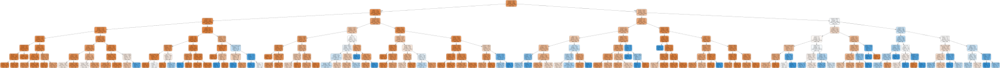

In [16]:
clf_4 = DecisionTreeClassifier(criterion = 'entropy', max_depth = 7)
clf_4 = clf_4.fit(batches[3][0], batches[3][1])

dot_data = export_graphviz(clf_4, feature_names = features.columns, class_names = features.columns,
                           filled = True, rounded = True, special_characters = True)
graph = graphviz.Source(dot_data)
display(graph)

### Evaluation

              precision    recall  f1-score   support

          no       0.92      0.96      0.94     23954
         yes       0.55      0.37      0.44      3173

    accuracy                           0.89     27127
   macro avg       0.74      0.66      0.69     27127
weighted avg       0.88      0.89      0.88     27127



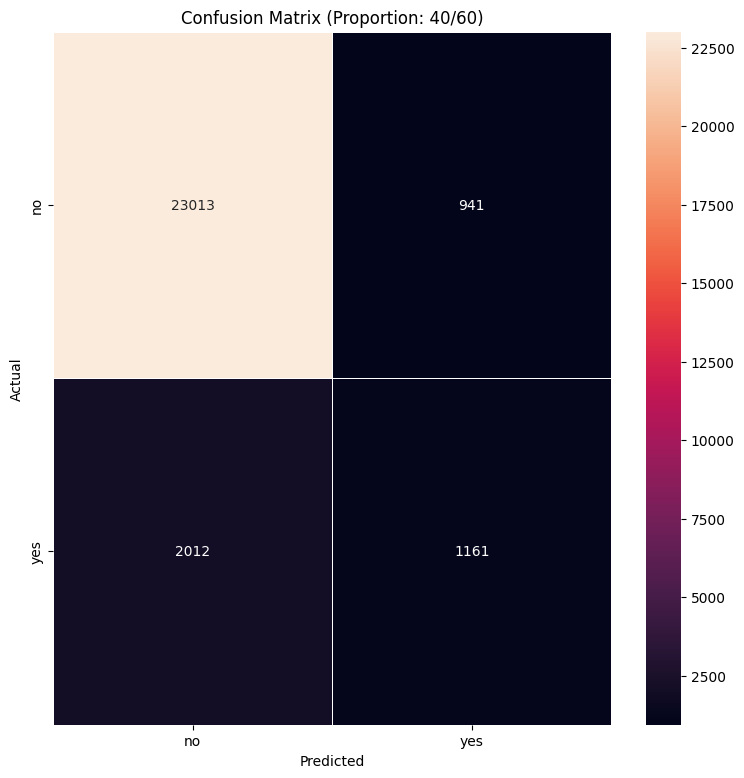

In [17]:
pred_1 = clf_1.predict(batches[0][2])
print(classification_report(batches[0][3], pred_1))
cfm_1 = confusion_matrix(batches[0][3], pred_1)
plt.figure(figsize=(9, 9))
sns.heatmap(cfm_1, annot = True, fmt = 'd', linewidths = 0.5, xticklabels = ['no', 'yes'], yticklabels = ['no', 'yes'])
plt.title('Confusion Matrix (Proportion: 40/60)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

              precision    recall  f1-score   support

          no       0.92      0.96      0.94     15969
         yes       0.56      0.35      0.43      2116

    accuracy                           0.89     18085
   macro avg       0.74      0.65      0.68     18085
weighted avg       0.88      0.89      0.88     18085



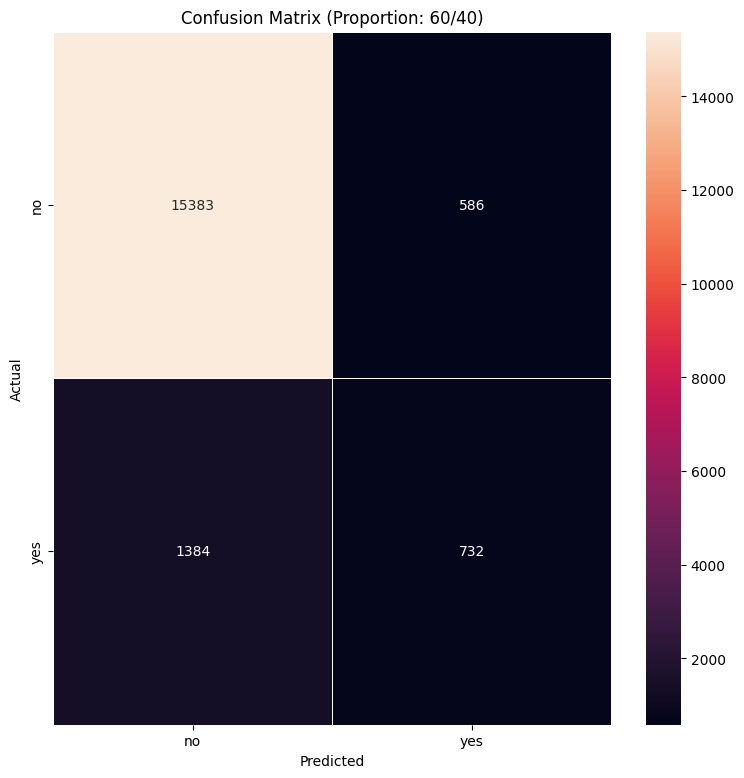

In [18]:
pred_2 = clf_2.predict(batches[1][2])
print(classification_report(batches[1][3], pred_2))
cfm_2 = confusion_matrix(batches[1][3], pred_2)
plt.figure(figsize=(9, 9))
sns.heatmap(cfm_2, annot = True, fmt = 'd', linewidths = 0.5, xticklabels = ['no', 'yes'], yticklabels = ['no', 'yes'])
plt.title('Confusion Matrix (Proportion: 60/40)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

              precision    recall  f1-score   support

          no       0.93      0.95      0.94      7985
         yes       0.53      0.44      0.48      1058

    accuracy                           0.89      9043
   macro avg       0.73      0.69      0.71      9043
weighted avg       0.88      0.89      0.88      9043



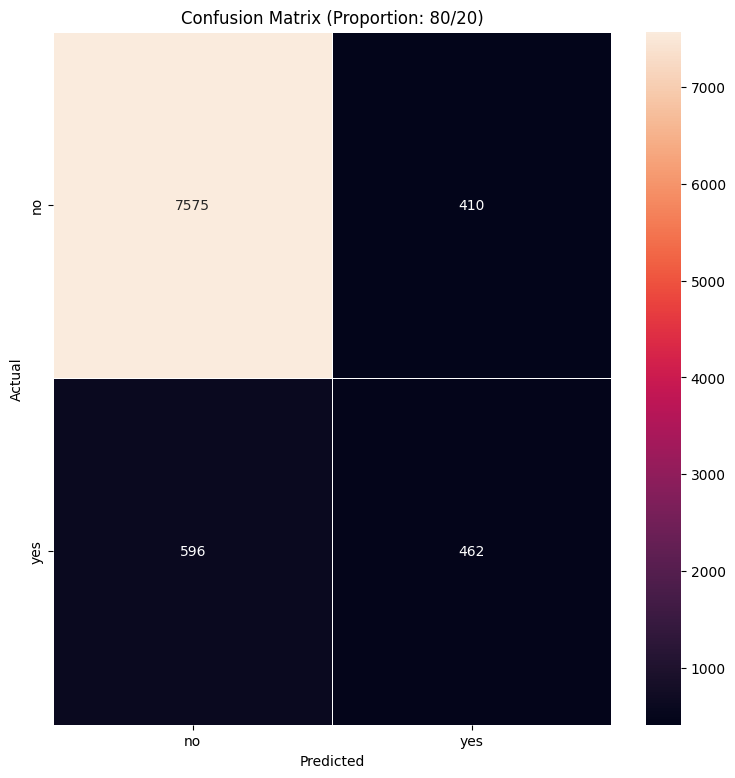

In [19]:
pred_3 = clf_3.predict(batches[2][2])
print(classification_report(batches[2][3], pred_3))
cfm_3 = confusion_matrix(batches[2][3], pred_3)
plt.figure(figsize=(9, 9))
sns.heatmap(cfm_3, annot = True, fmt = 'd', linewidths = 0.5, xticklabels = ['no', 'yes'], yticklabels = ['no', 'yes'])
plt.title('Confusion Matrix (Proportion: 80/20)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

              precision    recall  f1-score   support

          no       0.92      0.97      0.94      3993
         yes       0.58      0.33      0.42       529

    accuracy                           0.89      4522
   macro avg       0.75      0.65      0.68      4522
weighted avg       0.88      0.89      0.88      4522



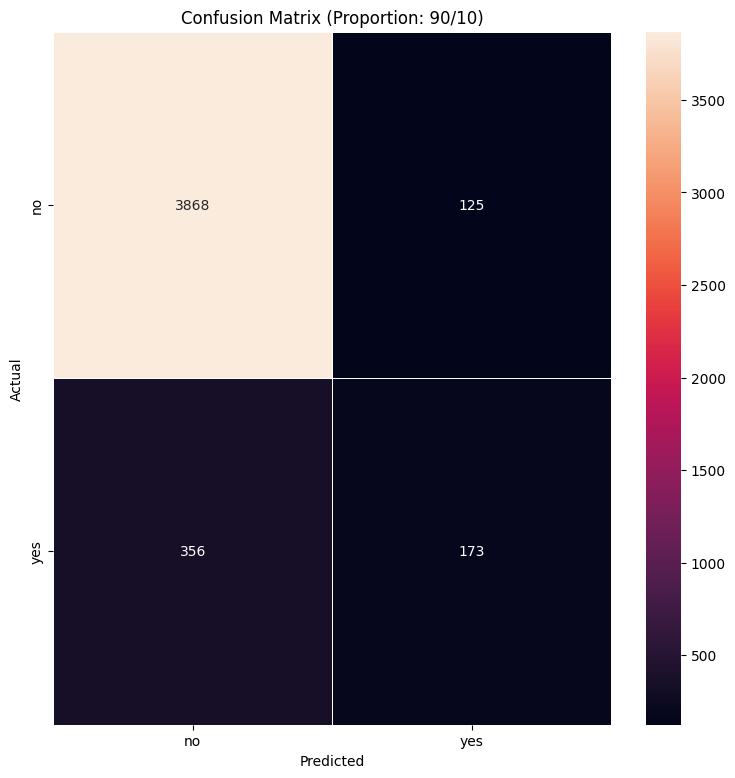

In [20]:
pred_4 = clf_4.predict(batches[3][2])
print(classification_report(batches[3][3], pred_4))
cfm_4 = confusion_matrix(batches[3][3], pred_4)
plt.figure(figsize=(9, 9))
sns.heatmap(cfm_4, annot = True, fmt = 'd', linewidths = 0.5, xticklabels = ['no', 'yes'], yticklabels = ['no', 'yes'])
plt.title('Confusion Matrix (Proportion: 90/10)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### Depth and Accuracy Score

In [21]:
# Depth List
max_depth = [None]
max_depth.extend(list(range(2, 8)))
clf_models = []
fit_time = []
accuracy = []

In [22]:
for depth in max_depth:
    feature_train, feature_test, label_train, label_test = train_test_split(enc_features, enc_targets, train_size = 0.8, stratify = enc_targets,
                                                                            random_state = np.uint64(np.random.rand() * 1024))
    clf_model = DecisionTreeClassifier(criterion = 'entropy', max_depth = depth)
    model_fit_time_start = time.time()
    clf_model = clf_model.fit(feature_train, label_train)
    model_fit_time = time.time() - model_fit_time_start
    clf_models.append(clf_model)
    fit_time.append(model_fit_time)
    pred = clf_model.predict(feature_test)
    accuracy.append(accuracy_score(label_test, pred))

In [23]:
# No Depth Limit
dot_data = export_graphviz(clf_models[0], feature_names = features.columns, class_names = features.columns,
                           filled = True, rounded = True, special_characters = True)
graph = graphviz.Source(dot_data)
display(graph)

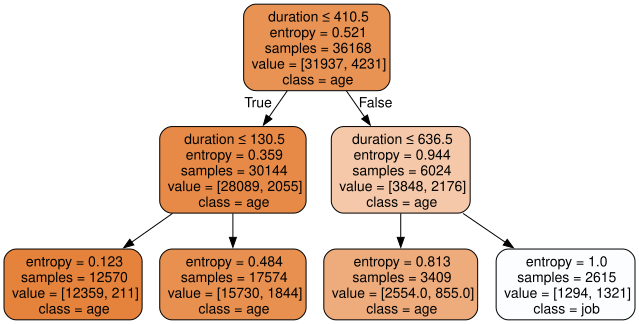

In [24]:
# Depth Limit = 2
dot_data = export_graphviz(clf_models[1], feature_names = features.columns, class_names = features.columns,
                           filled = True, rounded = True, special_characters = True)
graph = graphviz.Source(dot_data)
display(graph)

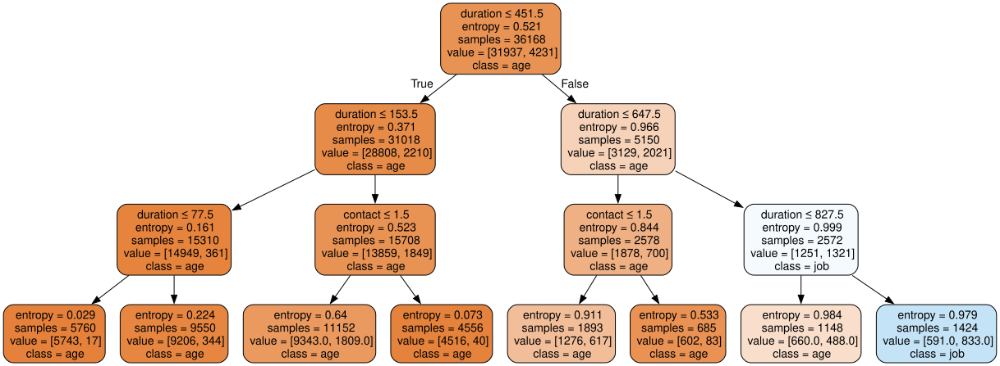

In [25]:
# Depth Limit = 3
dot_data = export_graphviz(clf_models[2], feature_names = features.columns, class_names = features.columns,
                           filled = True, rounded = True, special_characters = True)
graph = graphviz.Source(dot_data)
display(graph)

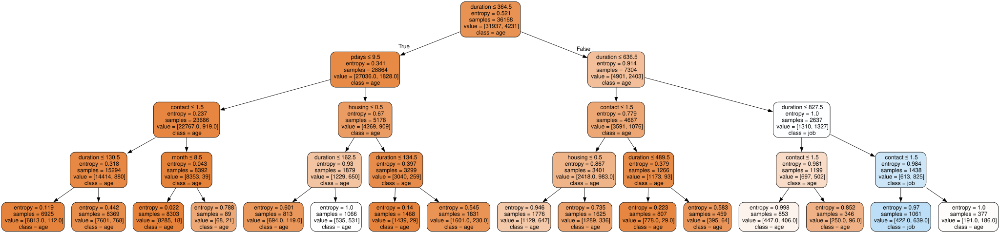

In [26]:
# Depth Limit = 4
dot_data = export_graphviz(clf_models[3], feature_names = features.columns, class_names = features.columns,
                           filled = True, rounded = True, special_characters = True)
graph = graphviz.Source(dot_data)
display(graph)

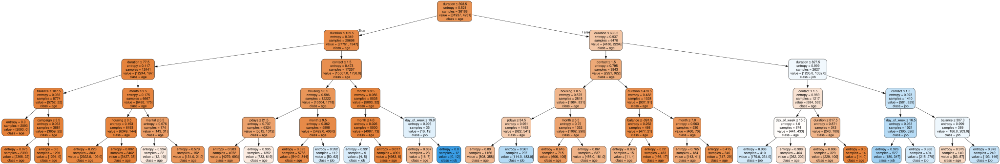

In [27]:
# Depth Limit = 5
dot_data = export_graphviz(clf_models[4], feature_names = features.columns, class_names = features.columns,
                           filled = True, rounded = True, special_characters = True)
graph = graphviz.Source(dot_data)
display(graph)

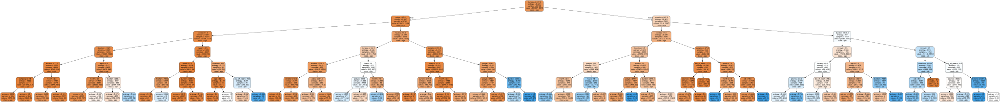

In [28]:
# Depth Limit = 6
dot_data = export_graphviz(clf_models[5], feature_names = features.columns, class_names = features.columns,
                           filled = True, rounded = True, special_characters = True)
graph = graphviz.Source(dot_data)
display(graph)

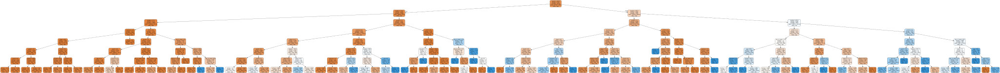

In [29]:
# Depth Limit = 7
dot_data = export_graphviz(clf_models[6], feature_names = features.columns, class_names = features.columns,
                           filled = True, rounded = True, special_characters = True)
graph = graphviz.Source(dot_data)
display(graph)

#### Accuracy Table

In [ ]:
max_depth[0] = 'None'
accuracy_df = pd.DataFrame({
    'Max Depth': max_depth,
    'Fit Time': fit_time,
    'Accuracy': accuracy
})
accuracy_df[['Max Depth', 'Accuracy']].set_index('Max Depth').T

Max Depth,None,2,3,4,5,6,7
Accuracy,0.873162,0.885657,0.888311,0.891518,0.889085,0.896937,0.894615


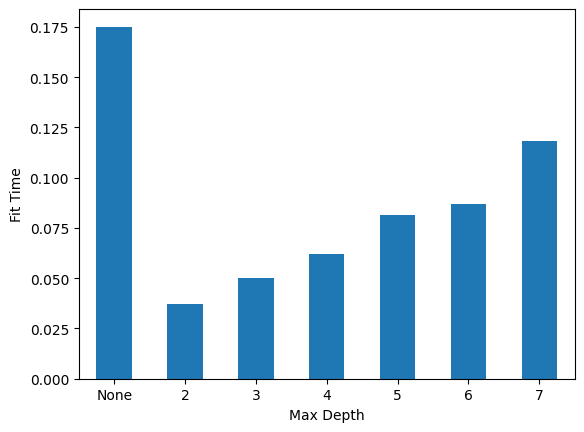

In [31]:
accuracy_df[['Max Depth', 'Fit Time']].plot(x = 'Max Depth', ylabel = 'Fit Time', kind = 'bar', legend = False, rot = 0)
plt.show()